**Single Shot Detector - SSD**

O SSD utiliza uma única rede neural para realizar a detecção de objetos. Ele inicia com um modelo pré-treinado que é convertido em um rede neural convolucional.

O SSD divide a imagem em diversos segmentos e então desenha caixas delimitadoras dentro desses segmentos, os objetos são detectados dentro dessas caixas delimitadoras.

Um framework para a detecção de objetos costuma ser composto de três passos:
- Um modelo ou algoritmo gera um grande consjunto de caixas delimitadras;
- As caracteristicas visuais são extraídas de cada caixa delimitadora;
- As caixas delimitadoras são então combinadas em uma única caixa.

A TensorFlow Object Detection API, é uma API que facilita a tarefa de detecção de objetos.

**MobileNet-SSD**

Trata-se de uma arquitetura do modelo SSD que é composta por uma única rede neural que prediz as caixas delimitadoras e suas localizações em uma única passagem.


https://medium.com/analytics-vidhya/build-your-own-object-detection-model-using-tensorflow-api-f15ebd11b4e8
https://colab.research.google.com/github/luxonis/depthai-ml-training/blob/master/colab-notebooks/Easy_Object_Detection_With_Custom_Data_Demo_Training.ipynb#scrollTo=6LnZjgF4N71_

Instalação dos modelos

In [ ]:
#!pip install -U --pre tensorflow=="2.*"
!pip install tensorflow==2.7.0

     |████████████████████████████████| 489.6 MB 20 kB/s 
     |████████████████████████████████| 1.3 MB 49.2 MB/s 
     |████████████████████████████████| 463 kB 49.1 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: keras
    Found existing installation: keras 2.8.0
    Uninstalling keras-2.8.0:
      Successfully uninstalled keras-2.8.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.3
    Uninstalling gast-0.5.3:
      Successfully uninstalled gast-0.5.3
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.0+zzzcolab20220506162203
    Uninstalling tensorflow-2.8.0+zzzcolab20220506162203:
      Successfully uninstalled tensorflow-2.8.0+zzzcolab20220506162203


In [ ]:
!pip install pycocotools

In [ ]:
!pip install tf_slim

     |████████████████████████████████| 352 kB 4.2 MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import pathlib

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3344, done.
remote: Counting objects: 100% (3344/3344), done.
remote: Compressing objects: 100% (2778/2778), done.
remote: Total 3344 (delta 882), reused 1376 (delta 515), pack-reused 0
Receiving objects: 100% (3344/3344), 34.34 MiB | 12.81 MiB/s, done.
Resolving deltas: 100% (882/882), done.


**Compilando o modelo**

In [ ]:
%cd /content/models/research/

/content/models/research


In [ ]:
!ls

adversarial_text    deeplab		   marco	     seq_flow_lite
attention_ocr	    deep_speech		   nst_blogpost      slim
audioset	    delf		   object_detection  vid2depth
autoaugment	    efficient-hrl	   pcl_rl
cognitive_planning  lfads		   README.md
cvt_text	    lstm_object_detection  rebar


In [ ]:
!protoc object_detection/protos/*.proto --python_out=.

In [ ]:
%cd /content/models/research/

/content/models/research


In [ ]:
%pip install

ERROR: You must give at least one requirement to install (see "pip help install")


**Importando as bibliotecas**

In [ ]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

In [ ]:
import tensorflow as tf

In [ ]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

**Preparação do modelo**

In [ ]:
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'  # Link para baixar o modelo
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/'saved_model'

  model = tf.saved_model.load(str(model_dir))
  model = model.signatures['serving_default']

  return model

**Carregando o mapa de categorias**

O mapa de categoirias indica qual categoria o objeto pertence

In [ ]:
PATH_TO_LABELS = '/content/models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [ ]:
print(f'Qtd de categorias: {len(category_index)}')
category_index

Qtd de categorias: 80


{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

In [ ]:
# Imagens de teste
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('/content/models/research/object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))

**Carregando o modelo**

In [ ]:
model_name = 'ssd_mobilenet_v1_coco_2017_11_17' # SSD MobileNet 2017
detection_model = load_model(model_name)

76546048/76534733 [==============================] - 5s 0us/step
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
detection_model.inputs

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]

In [ ]:
detection_model.output_dtypes

{'detection_boxes': tf.float32,
 'detection_classes': tf.float32,
 'detection_scores': tf.float32,
 'num_detections': tf.float32}

In [ ]:
# Função para limpar a saída e chamar o modelo
def executar_deteccao_imagem(modelo, imagem):
  imagem = np.asarray(imagem) # Convertendo para numpy

  input_tensor = tf.convert_to_tensor(imagem) # Convertendo para o formato do tensor
  input_tensor = input_tensor[tf.newaxis, ...] # Adicionando uma nova dimensão no tensor que diz respeito ao batch size

  # Executando a inferência
  output_dict = modelo(input_tensor)

  # Convertendo para array numpy e removendo a dimensão extra
  num_detections = int(output_dict.pop('num_detections'))

  output_dict = {key:value[0, :num_detections].numpy() for key, value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # Convertendo as classes para int
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

  # Manipulando os modelos e as máscaras

  if 'detection_masks' in output_dict:
    # Corrigindo o tamanho da imagem e adicionado a caixa delimitadora
    detection_reframed = utils_ops.reframe_box_masks_to_image_masks(output_dict['detection_masks'],
                                                                    output_dict['detection_masks'], output_dict['detection_boxes'],
                                                                    imagem.shape[0], imagem.shape[1])
    detection_reframed = tf.cast(detection_reframed > 0.5, tf.uint8)
    output_dict['detection_masks_reframed'] = detection_reframed.numpy()
  
  return output_dict

In [ ]:
def mostrar_inferencia(modelo, imagem_path):
  # Preparando a imagem para ser dada como entrada para a rede
  imagem_np = np.array(Image.open(imagem_path))
  output_dict = executar_deteccao_imagem(modelo, imagem_np)

  # Exibindo o resultado
  vis_util.visualize_boxes_and_labels_on_image_array(
    imagem_np,
    output_dict['detection_boxes'],
    output_dict['detection_classes'],
    output_dict['detection_scores'],
    category_index,
    instance_masks=output_dict.get('detection_masks_reframed', None),
    use_normalized_coordinates=True,
    line_thickness=8)

  display(Image.fromarray(imagem_np))

In [ ]:
for image_path in TEST_IMAGE_PATHS:
  mostrar_inferencia(detection_model, image_path)

**Testes com outros modelos**

**Links com modelos**

- [Github oficial do tensorflow](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md)

Alguns nomes de modelos:

- ssd_mobilenet_v1_coco_2018_01_28;
- ssd_mobilenet_v2_coco_2018_03_29;
- ssd_inception_v2_coco_2018_01_28;
- ssd_resnet50_v1_fpn_shared_box_predictor_640x640_coco14_sync_2018_07_03

In [36]:
model_name = 'ssd_resnet50_v1_fpn_shared_box_predictor_640x640_coco14_sync_2018_07_03'
detection_model = load_model(model_name)

366960640/366947246 [==============================] - 6s 0us/step
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [37]:
detection_model.inputs, detection_model.output_dtypes

([<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>],
 {'detection_boxes': tf.float32,
  'detection_classes': tf.float32,
  'detection_scores': tf.float32,
  'num_detections': tf.float32})

In [ ]:
for image_path in TEST_IMAGE_PATHS:
  mostrar_inferencia(detection_model, image_path)

278126592/278114232 [==============================] - 5s 0us/step
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


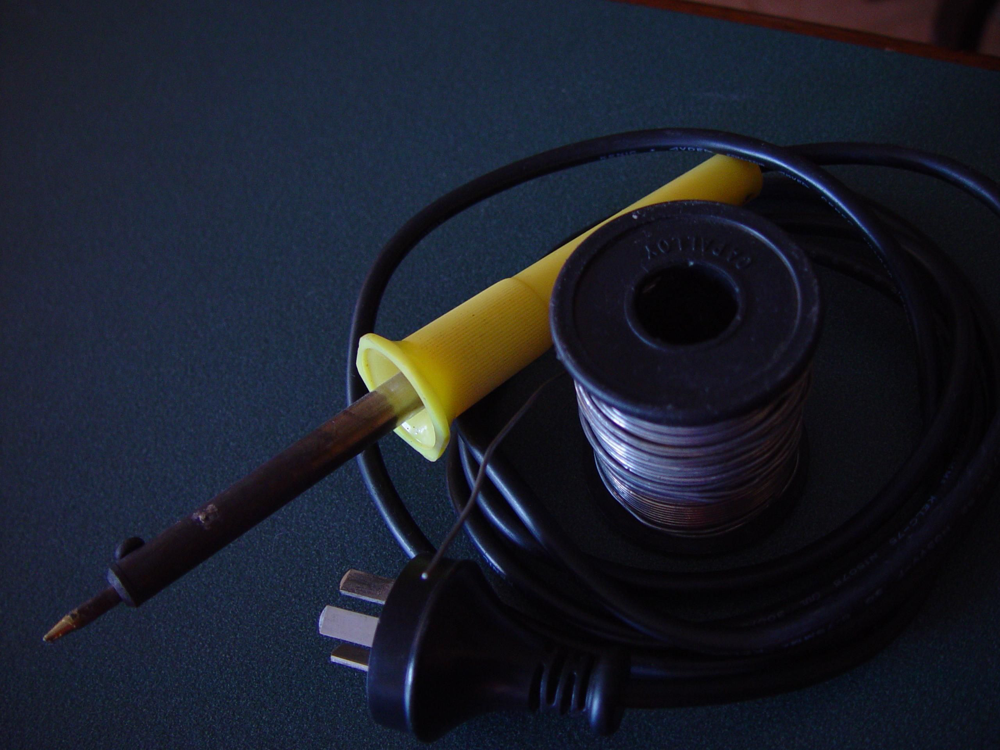

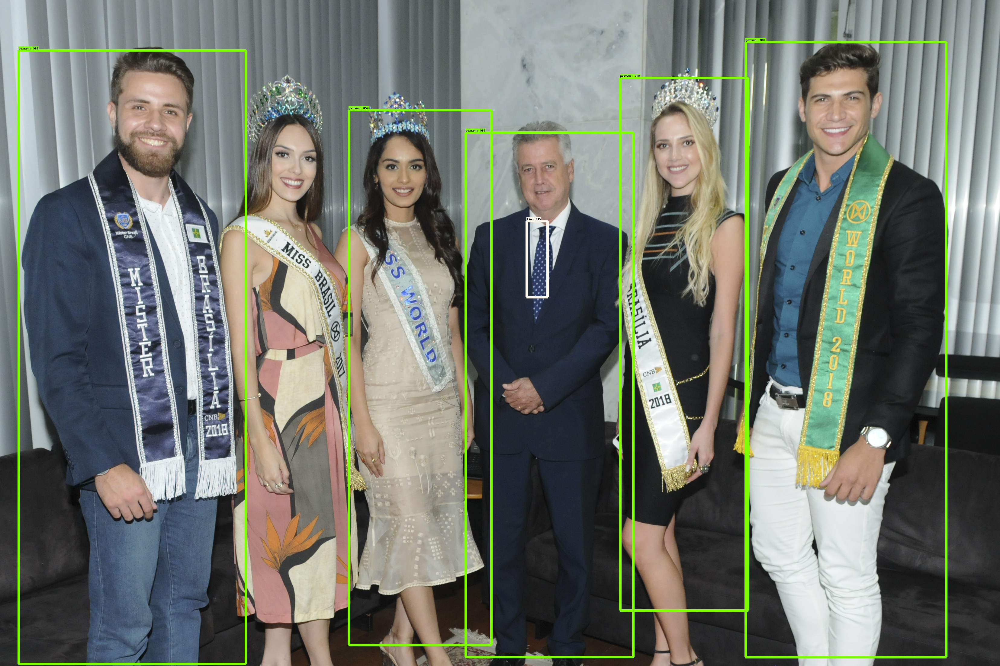

In [40]:
model_name = 'ssd_inception_v2_coco_2018_01_28'
detection_model = load_model(model_name)
TEST_IMAGE_PATHS = ['/content/img-ferro-solda.jpg', '/content/img-pessoas.jpg']
for image_path in TEST_IMAGE_PATHS:
  mostrar_inferencia(detection_model, image_path)